In [183]:
#Import different modules

import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import random

import seaborn as sns

from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, recall_score, precision_score, f1_score, roc_auc_score, accuracy_score

from yellowbrick.classifier import ClassificationReport, ROCAUC

from sklearn.tree import DecisionTreeClassifier

from IPython.display import Image  

from sklearn import tree

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

In [184]:
# Read the data from the file and making dataframe from the csv file

data = pd.read_csv('bank-full.csv')

### 1. Exploratory data quality report

In [185]:
# Display the dataset along with the number of rows and columns

print('Shape of the data:',data.shape,'\n') # Displays the dimension of the dataframe

display(data.head())

print('\n\nThe number of rows in the file are ', data.shape[0])
print('\n\nThe number of columns in the file are ', data.shape[1])

Shape of the data: (45211, 17) 



,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no




The number of rows in the file are  45211


The number of columns in the file are  17


In [186]:
# Check the data types

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  Target     45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


### Note:
        Many columns are type - objects (strings). Needs to be converted in the ordinal type.

In [187]:
# Check for the null or na values in the dataset

if(data.isnull().any().any()):
    print('There are null or nan values in the dataset')
print('There are no null or nan values in the dataset')    

# Check the number of uniques entries for each column

print('\nNumber of unique entries in each columns are: ')
data.nunique()


There are no null or nan values in the dataset

Number of unique entries in each columns are: 


age            77
job            12
marital         3
education       4
default         2
balance      7168
housing         2
loan            2
contact         3
day            31
month          12
duration     1573
campaign       48
pdays         559
previous       41
poutcome        4
Target          2
dtype: int64

### Attribute Information:

        Input variables:

        1 - age (numeric Continuous)

        2 - job : (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')

        3 - marital : (categorical: 'divorced','married','single')

        4 - education (categorical: primary, secondary, tertiary, unknown)

        5 - default: (categorical: 'no','yes')

        6 - housing: (categorical: 'no','yes')

        7 - loan: (categorical: 'no','yes')

        8 - contact: (categorical: 'cellular','telephone', 'unknown')

        9 - month: (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')

        10 - day: (categorical: '1','2','3','4','5'....., '28','29','30','31')

        11 - duration: (numeric). 

        12 - campaign: (numeric, includes last contact)

        13 - pdays: (numeric)

        14 - previous: (numeric)

        15 - poutcome: (categorical: 'failure','other','success','unknown')

        16 - balance: (numeric)

### Output Variable

        17 - Target: (categorical: 'no','yes') 

In [188]:
# Description of the attributes

data.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.94,10.62,18.0,33.0,39.0,48.0,95.0
balance,45211.0,1362.27,3044.77,-8019.0,72.0,448.0,1428.0,102127.0
day,45211.0,15.81,8.32,1.0,8.0,16.0,21.0,31.0
duration,45211.0,258.16,257.53,0.0,103.0,180.0,319.0,4918.0
campaign,45211.0,2.76,3.10,1.0,1.0,2.0,3.0,63.0
pdays,45211.0,40.20,100.13,-1.0,-1.0,-1.0,-1.0,871.0
previous,45211.0,0.58,2.30,0.0,0.0,0.0,0.0,275.0


### Visualing the continuous variables using boxplots

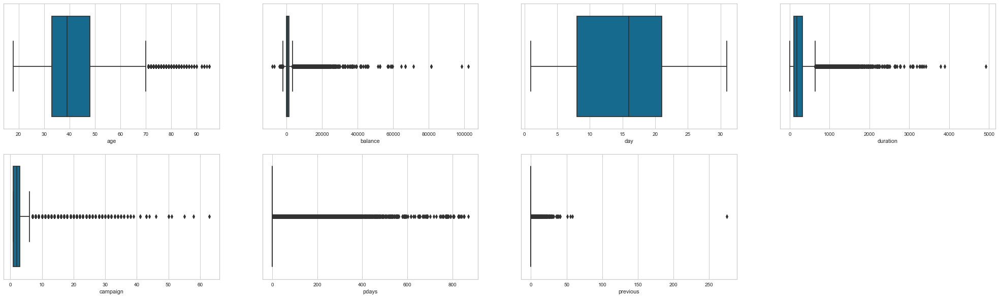

In [189]:
plt.figure(figsize = (35,10))

plt.subplot(2, 4, 1)
sns.boxplot(data['age'])

plt.subplot(2, 4, 2)
sns.boxplot(data['balance'])

plt.subplot(2, 4, 3)
sns.boxplot(data['day'])

plt.subplot(2, 4, 4)
sns.boxplot(data['duration'])

plt.subplot(2, 4, 5)
sns.boxplot(data['campaign'])

plt.subplot(2, 4, 6)
sns.boxplot(data['pdays'])

plt.subplot(2, 4, 7)
sns.boxplot(data['previous'])

plt.show()

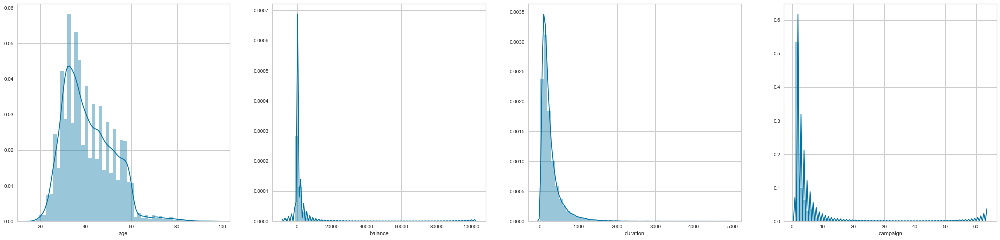

In [190]:
plt.figure(figsize = (35,8))

plt.subplot(1, 4, 1)
sns.distplot(data['age'])

plt.subplot(1, 4, 2)
sns.distplot(data['balance'])

plt.subplot(1, 4, 3)
sns.distplot(data['duration'])

plt.subplot(1, 4, 4)
sns.distplot(data['campaign'])

plt.show()

### Notes:
    
   There are outliers for the attributes:
        1. age
        2. balance: Balance in the account
        3. duration: Duration of contact
        4. campaign: Number of contacts performed during the campaign
        5. pdays: Number of days the person has not been contacted
        6. previous: number of conctacts performed beofre this campaign

   The data in terms of is biased for the following attributes:
        1. age
        2. balance
        3. duration
        4. campaign
 
### Outlier treatment

   Capping the outliers for attributes: duration, campaign, pdays, previous. 
   
   Negative values of the attribute 'Balance' are converted to 'zeros', since the balance in account cannot be negative. 
   
   For the attribute 'Age': No outlier treatment is done, as the data can incldue the information about wide range of age group. 

In [191]:
data.loc[data.balance < 0, 'balance'] = 0

neg = data[data['balance'] < 0]
neg.shape[0]

0

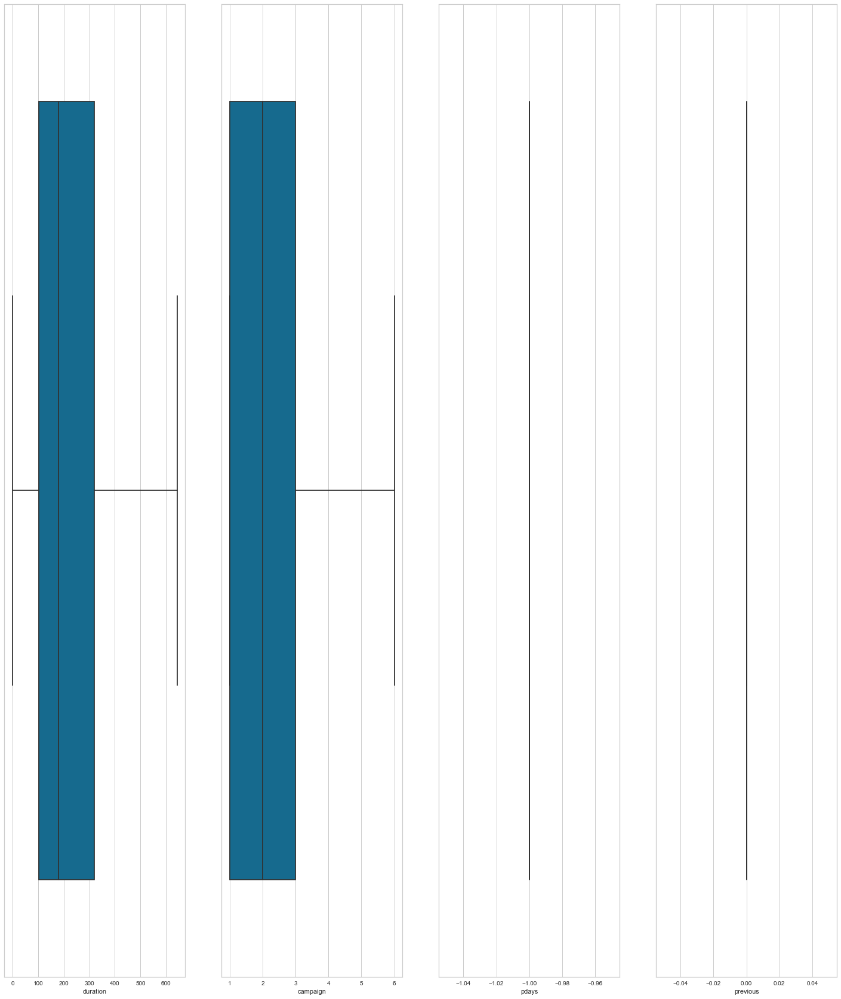

In [192]:
data['duration'] = data['duration'].astype(int) # converting the data type from string to float

# capping the outliers and re-plotting the boxplots

arr = ['duration','campaign','pdays', 'previous']
for i in arr:
    q1, q2, q3 = data[i].quantile([0.25, 0.5, 0.75])
    IQR = q3 - q1
    lower_cap = q1 - 1.5*IQR
    upper_cap = q3 + 1.5*IQR
    data[i] = data[i].apply(lambda x: upper_cap if x>(upper_cap) else (lower_cap if x<(lower_cap) else x))

plt.figure(figsize = (25,30))
pos = 1
for i in arr:
    plt.subplot(1,4,pos)
    sns.boxplot(data[i])
    pos +=1

### Visualizing the data with bivariate plots

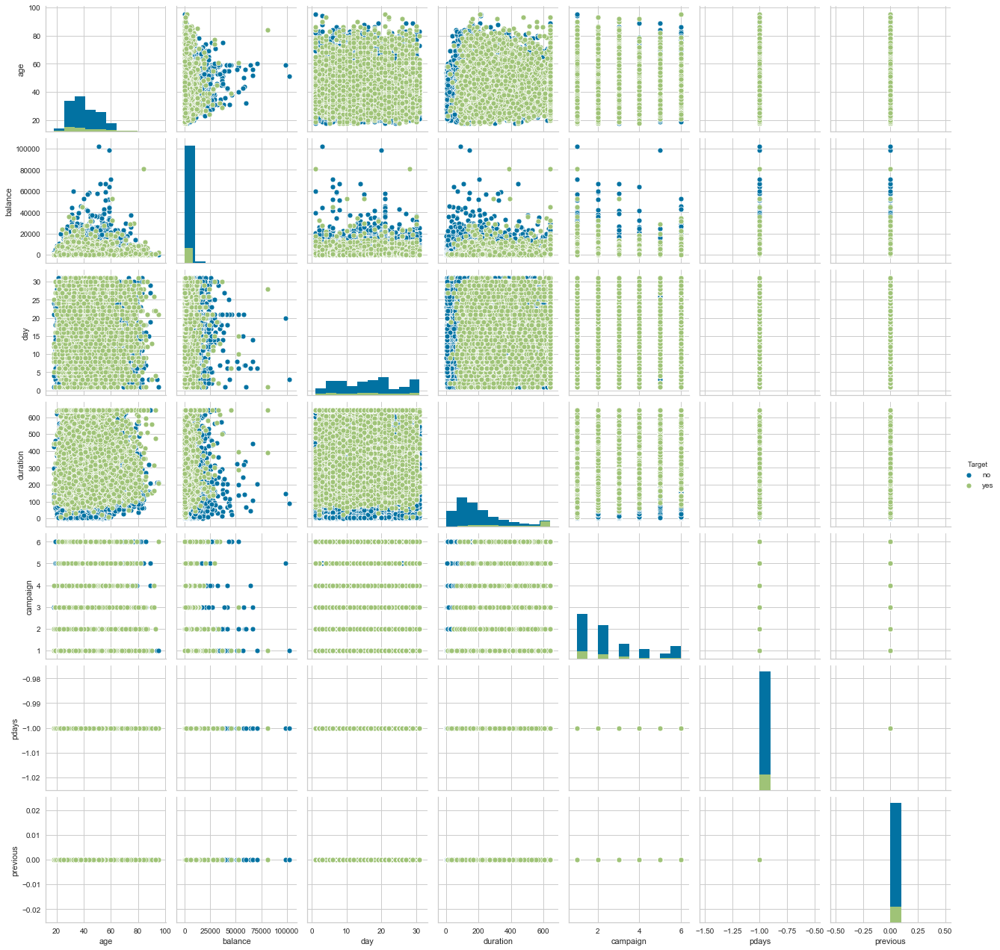

In [193]:
sns.pairplot(data, hue = 'Target', diag_kind='hist', kind='scatter')
plt.show()

In [194]:
data.corr()

,age,balance,day,duration,campaign,pdays,previous
age,1.000000,0.097730,-0.009120,-0.011735,0.023922,NaN,NaN
balance,0.097730,1.000000,0.005788,0.022680,-0.015694,NaN,NaN
day,-0.009120,0.005788,1.000000,-0.039285,0.152975,NaN,NaN
duration,-0.011735,0.022680,-0.039285,1.000000,-0.100049,NaN,NaN
campaign,0.023922,-0.015694,0.152975,-0.100049,1.000000,NaN,NaN
pdays,NaN,NaN,NaN,NaN,NaN,NaN,NaN
previous,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Converting to categorical variables:

In [195]:
# Converting the columns with an 'object' datatype into integer

for feature in data.columns: # Loops through all columns in the dataframe
    if data[feature].dtype == 'object': # Only apply for columns with categorical strings
        data[feature] = pd.Categorical(data[feature])# Replace strings with an integer

data.dtypes

age             int64
job          category
marital      category
education    category
default      category
balance         int64
housing      category
loan         category
contact      category
day             int64
month        category
duration      float64
campaign      float64
pdays         float64
previous      float64
poutcome     category
Target       category
dtype: object

In [196]:
d1 = data.copy()
d1 = d1.drop(d1.columns[[0,5,11,12,13,14]], axis = 1)
cat_col_name = list(d1.columns)

print('Categorical columns are:\n')
print(cat_col_name)

Categorical columns are:

['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'day', 'month', 'poutcome', 'Target']


In [197]:
for i in d1.columns:
    print(d1[i].value_counts(),'\n\n')

blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64 


married     27214
single      12790
divorced     5207
Name: marital, dtype: int64 


secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education, dtype: int64 


no     44396
yes      815
Name: default, dtype: int64 


yes    25130
no     20081
Name: housing, dtype: int64 


no     37967
yes     7244
Name: loan, dtype: int64 


cellular     29285
unknown      13020
telephone     2906
Name: contact, dtype: int64 


20    2752
18    2308
21    2026
17    1939
6     1932
5     1910
14    1848
8     1842
28    1830
7     1817
19    1757
29    1745
15    1703
12    1603
13    1585
30    1566
9     1561
11    1479
4     1445
16    1415
2     1293
27    1121
3     1079
26    

In [198]:
replaceStruct = {
                'job': {'blue-collar':1, 'management':2, 'technician':3, 'admin.':4, 'services':5, 'retired':6, 
                        'self-employed':7, 'entrepreneur':8, 'unemployed':9, 'housemaid':10, 'student':11, 'unknown':12},
                'marital': {'married':1, 'single':2, 'divorced':3},
                'education': {'primary':1, 'secondary':2, 'tertiary':3, 'unknown':4},
                'default': {'yes':1, 'no':2},
                'housing':{'yes':1, 'no':2},
                'loan': {'yes':1, 'no':2},
                'contact': {'cellular':1, 'telephone':2, 'unknown':3},
                'month': {'jan':1, 'feb':2, 'mar':3, 'apr':4, 'may':5, 'jun':6, 'jul':7, 'aug':8, 'sep':9, 'oct':10,
                          'nov':11, 'dec':12},
                'Target': {'yes':1, 'no':0}
                }

oneHotCols = {'poutcome'}

In [199]:
d1 = data.copy()
d1 = d1.replace(replaceStruct)
d1 = pd.get_dummies(d1, columns = oneHotCols)
d1.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,Target,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
0,58,2,1,3,2,2143,1,2,3,5,5,261.0,1.0,-1.0,0.0,0,0,0,0,1
1,44,3,2,2,2,29,1,2,3,5,5,151.0,1.0,-1.0,0.0,0,0,0,0,1
2,33,8,1,2,2,2,1,1,3,5,5,76.0,1.0,-1.0,0.0,0,0,0,0,1
3,47,1,1,4,2,1506,1,2,3,5,5,92.0,1.0,-1.0,0.0,0,0,0,0,1
4,33,12,2,4,2,1,2,2,3,5,5,198.0,1.0,-1.0,0.0,0,0,0,0,1


In [200]:
d1 = d1[['age', 'job', 'marital', 'education', 'default', 'balance', 'housing', 'loan', 'contact', 'day', 'month',
         'duration', 'campaign', 'pdays', 'previous', 'poutcome_failure', 'poutcome_other', 'poutcome_success',
         'poutcome_unknown','Target']]
d1.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown,Target
0,58,2,1,3,2,2143,1,2,3,5,5,261.0,1.0,-1.0,0.0,0,0,0,1,0
1,44,3,2,2,2,29,1,2,3,5,5,151.0,1.0,-1.0,0.0,0,0,0,1,0
2,33,8,1,2,2,2,1,1,3,5,5,76.0,1.0,-1.0,0.0,0,0,0,1,0
3,47,1,1,4,2,1506,1,2,3,5,5,92.0,1.0,-1.0,0.0,0,0,0,1,0
4,33,12,2,4,2,1,2,2,3,5,5,198.0,1.0,-1.0,0.0,0,0,0,1,0


In [201]:
d1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   age               45211 non-null  int64  
 1   job               45211 non-null  int64  
 2   marital           45211 non-null  int64  
 3   education         45211 non-null  int64  
 4   default           45211 non-null  int64  
 5   balance           45211 non-null  int64  
 6   housing           45211 non-null  int64  
 7   loan              45211 non-null  int64  
 8   contact           45211 non-null  int64  
 9   day               45211 non-null  int64  
 10  month             45211 non-null  int64  
 11  duration          45211 non-null  float64
 12  campaign          45211 non-null  float64
 13  pdays             45211 non-null  float64
 14  previous          45211 non-null  float64
 15  poutcome_failure  45211 non-null  uint8  
 16  poutcome_other    45211 non-null  uint8 

In [202]:
d1.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.94,10.62,18.0,33.0,39.0,48.0,95.0
job,45211.0,3.70,2.67,1.0,2.0,3.0,5.0,12.0
marital,45211.0,1.51,0.69,1.0,1.0,1.0,2.0,3.0
education,45211.0,2.22,0.75,1.0,2.0,2.0,3.0,4.0
default,45211.0,1.98,0.13,1.0,2.0,2.0,2.0,2.0
balance,45211.0,1388.73,3029.53,0.0,72.0,448.0,1428.0,102127.0
housing,45211.0,1.44,0.50,1.0,1.0,1.0,2.0,2.0
loan,45211.0,1.84,0.37,1.0,2.0,2.0,2.0,2.0
contact,45211.0,1.64,0.90,1.0,1.0,1.0,3.0,3.0
day,45211.0,15.81,8.32,1.0,8.0,16.0,21.0,31.0


### Visualizing the data with bivariate plots

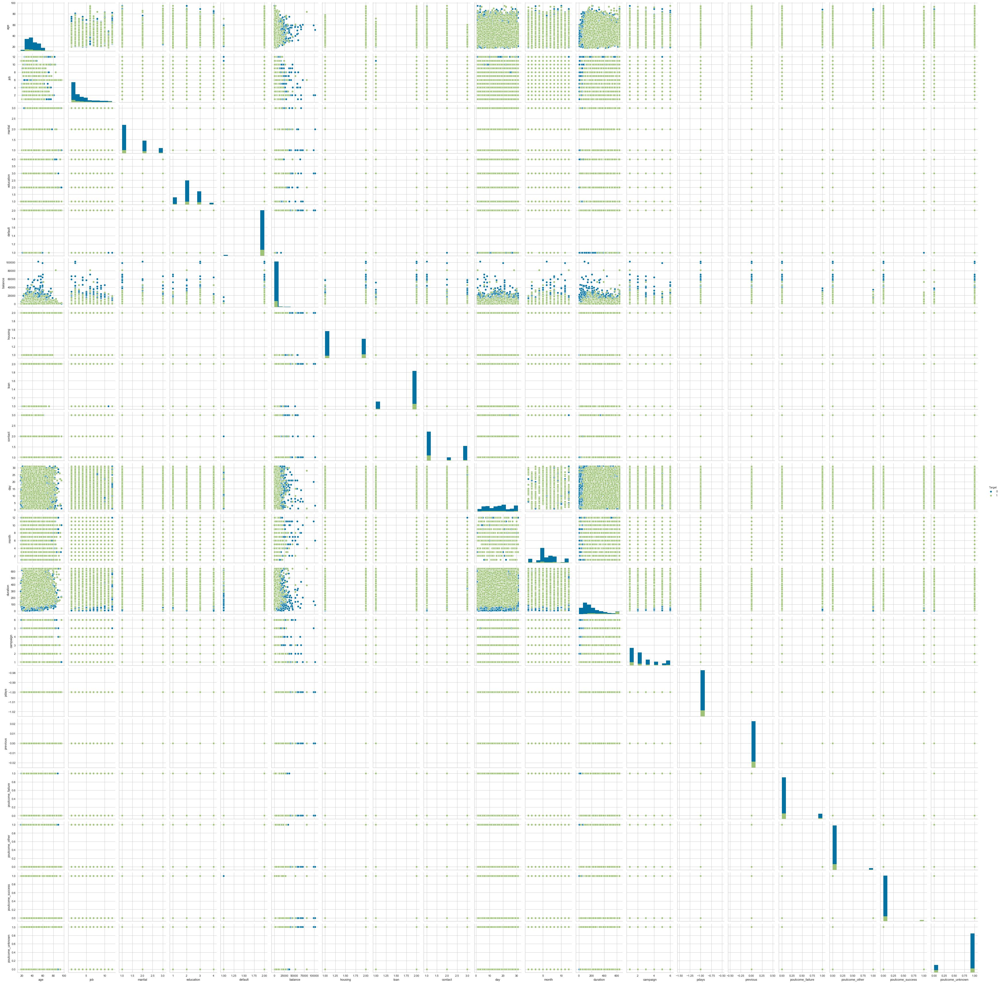

In [203]:
sns.pairplot(d1, hue = 'Target', diag_kind='hist', kind='scatter')
plt.show()

In [204]:
d1.corr()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown,Target
age,1.000000,0.077468,-0.126351,-0.106807,0.017879,0.097730,0.185513,0.015655,0.026221,-0.009120,0.092903,-0.011735,0.023922,NaN,NaN,-0.004927,-0.022967,0.035526,-0.000816,0.025155
job,0.077468,1.000000,0.050184,0.014861,0.003261,0.018899,0.175678,0.035331,-0.036939,-0.010874,0.016169,0.005477,-0.025348,NaN,NaN,-0.011940,-0.005534,0.039935,-0.006142,0.059027
marital,-0.126351,0.050184,1.000000,0.080759,-0.018404,-0.028236,0.011671,0.018526,-0.017638,-0.005217,-0.044321,0.018777,-0.041079,NaN,NaN,0.002323,0.021266,0.009146,-0.017003,0.043846
education,-0.106807,0.014861,0.080759,1.000000,0.010718,0.064265,0.090790,0.048574,-0.110928,0.022671,0.054729,0.001252,-0.001767,NaN,NaN,0.009625,0.002446,0.051218,-0.032830,0.066241
default,0.017879,0.003261,-0.018404,0.010718,1.000000,0.057112,-0.006025,0.077234,-0.015404,-0.009424,-0.014989,0.006710,-0.015827,NaN,NaN,0.026389,0.014445,0.023344,-0.039490,0.022419
balance,0.097730,0.018899,-0.028236,0.064265,0.057112,1.000000,0.065279,0.079532,-0.025614,0.005788,0.094230,0.022680,-0.015694,NaN,NaN,0.011318,0.007990,0.033912,-0.028976,0.051370
housing,0.185513,0.175678,0.011671,0.090790,-0.006025,0.065279,1.000000,0.041323,-0.188123,0.027982,0.173887,-0.004855,0.038689,NaN,NaN,-0.106795,-0.039710,0.091360,0.063755,0.139173
loan,0.015655,0.035331,0.018526,0.048574,0.077234,0.079532,0.041323,1.000000,0.010873,-0.011370,-0.021638,0.015421,-0.003230,NaN,NaN,0.002186,0.009099,0.053713,-0.031406,0.068185
contact,0.026221,-0.036939,-0.017638,-0.110928,-0.015404,-0.025614,-0.188123,0.010873,1.000000,-0.027936,-0.173779,-0.030374,0.004242,NaN,NaN,-0.216687,-0.118188,-0.113670,0.287746,-0.148395
day,-0.009120,-0.010874,-0.005217,0.022671,-0.009424,0.005788,0.027982,-0.011370,-0.027936,1.000000,0.101989,-0.039285,0.152975,NaN,NaN,-0.068700,-0.032952,-0.030321,0.086256,-0.028348


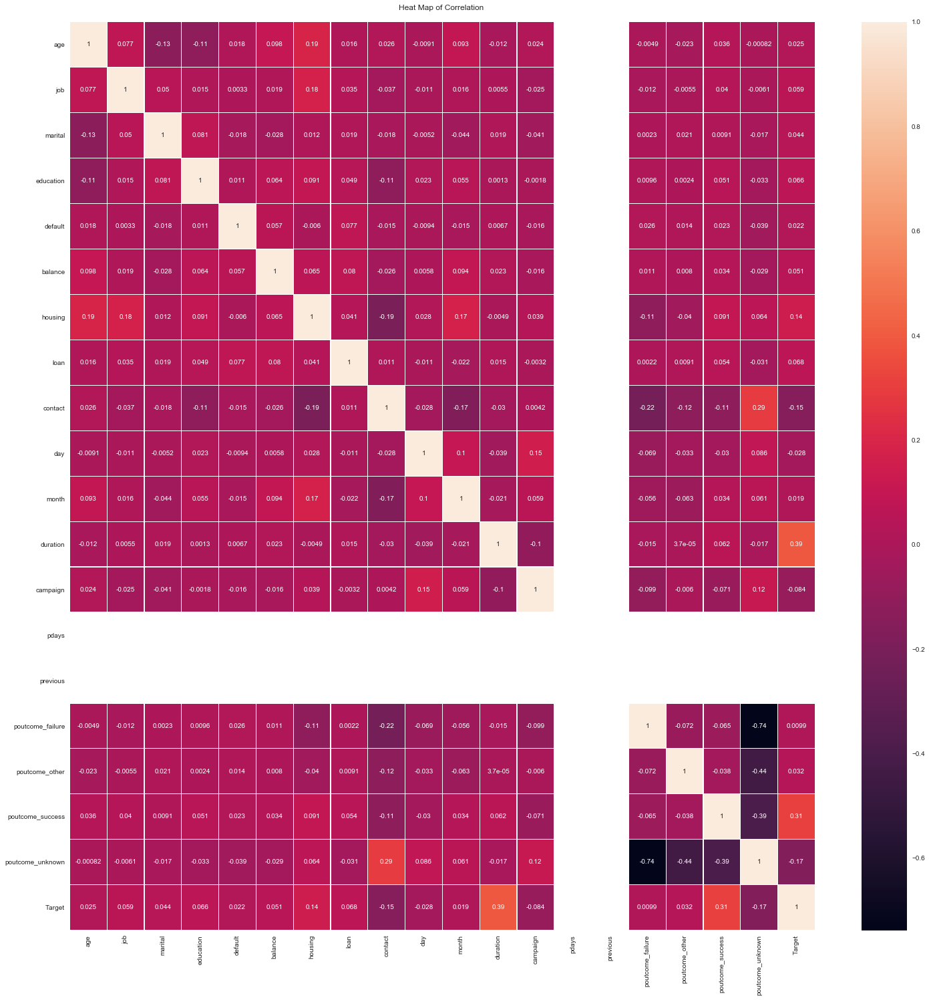

In [205]:
fig, ax = plt.subplots()
fig.set_size_inches(25,25)

plt.title('Heat Map of Correlation \n')
cor = d1.corr()
sns.heatmap(cor, annot = True, linewidths = 0.25)

plt.show()

#### Observation: 
   There are no linear relationships between two variables. 
   There are no strong correlation between any two variables.

### Checking the class balance

0    88.30152
1    11.69848
Name: Target, dtype: float64



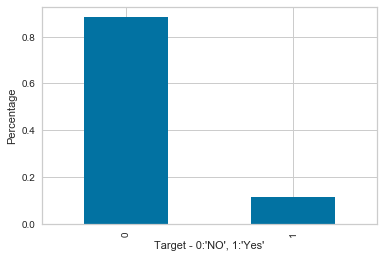

In [206]:
print(d1['Target'].value_counts(normalize=True)*100)
print()
d1['Target'].value_counts(normalize=True).plot(kind='bar')
plt.xlabel("Target - 0:'NO', 1:'Yes'")
plt.ylabel("Percentage")
plt.show()

#### Observation: 

The class is highly imbalanced. Normalizing the data.

### Splitting the data into training and test set in 70:30 ratio respectively

In [207]:
x = d1.loc[:, d1.columns != 'Target']  # independent variables

y = d1.loc[:, d1.columns == 'Target']  # Target variable

xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.3, random_state=7)

xtrain.shape, ytrain.shape, xtest.shape, ytest.shape

((31647, 19), (31647, 1), (13564, 19), (13564, 1))

## Logistic Regression Model

In [208]:
# Running a loop to check different values of 'solver'
# all solver can be used with l2, only 'liblinear' and 'saga' works with both 'l1' and 'l2'

train_score=[]
test_score=[]
solver = ['newton-cg','lbfgs','liblinear','sag','saga']
for i in solver:
    model = LogisticRegression(random_state=7, penalty='l2', solver=i)  # changing values of solver
    model.fit(xtrain, ytrain) 
    y_predict = model.predict(xtest)     
    train_score.append(round(model.score(xtrain,ytrain),3))
    test_score.append(round(model.score(xtest, ytest),3))
    
print(solver)
print()
print(train_score)
print()
print(test_score)

['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']

[0.895, 0.882, 0.895, 0.881, 0.881]

[0.899, 0.889, 0.898, 0.887, 0.887]


In [209]:
train_score=[]
test_score=[]
solver = ['liblinear','saga']  # changing values of solver which works with 'l1'
for i in solver:
    model = LogisticRegression(random_state=7, penalty='l1', solver=i)  # changed value of penaly to 'l1'
    model.fit(xtrain, ytrain) 
    y_predict = model.predict(xtest)     
    train_score.append(round(model.score(xtrain,ytrain),3))
    test_score.append(round(model.score(xtest, ytest),3))
    
print(solver)
print()
print(train_score)
print()
print(test_score)

['liblinear', 'saga']

[0.895, 0.881]

[0.899, 0.887]


In [210]:
# Checking Parameters of logistic regression
model.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l1',
 'random_state': 7,
 'solver': 'saga',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

### Observation

Highest accuracy in the test dataset is observed for the solver 'newton-cg' with 'l2' and 'liblinear' with 'l1'.

Either of the model paramters can be selected. 

In [211]:
train_score=[]                                 
test_score=[]
C = [0.01,0.1,0.25,0.5,0.75,1]
for i in C:
    model = LogisticRegression(random_state=7, penalty='l1', solver='liblinear', C=i)  # changing values of C
    model.fit(xtrain, ytrain) 
    y_predict = model.predict(xtest)     
    train_score.append(round(model.score(xtrain,ytrain),3)) # appending training accuracy in a blank list for every run of the loop
    test_score.append(round(model.score(xtest, ytest),3))   # appending testing accuracy in a blank list for every run of the loop
    
print(C)
print()
print(train_score)
print()
print(test_score)

[0.01, 0.1, 0.25, 0.5, 0.75, 1]

[0.893, 0.896, 0.895, 0.895, 0.895, 0.895]

[0.897, 0.9, 0.9, 0.9, 0.9, 0.899]


In [212]:
train_score=[]                                 
test_score=[]
C = [0.01,0.1,0.25,0.5,0.75,1]
for i in C:
    model = LogisticRegression(random_state=7, penalty='l2', solver='newton-cg', C=i)  # changing values of C
    model.fit(xtrain, ytrain) 
    y_predict = model.predict(xtest)     
    train_score.append(round(model.score(xtrain,ytrain),3)) # appending training accuracy in a blank list for every run of the loop
    test_score.append(round(model.score(xtest, ytest),3))   # appending testing accuracy in a blank list for every run of the loop
    
print(C)
print()
print(train_score)
print()
print(test_score)

[0.01, 0.1, 0.25, 0.5, 0.75, 1]

[0.893, 0.895, 0.895, 0.895, 0.895, 0.895]

[0.899, 0.9, 0.899, 0.899, 0.899, 0.899]


### Observation

For either of the solvers, best testing accuracy is obtained for 0.01 < C < 1 for solver as 'liblinear' in 'l1' and C = 0.1 for solver 'newton-cg' in 'l2'. Thus, the final model is as below:

Trainig accuracy 0.8949979460928366

Testing accuracy 0.8995134178708346

Confusion Matrix


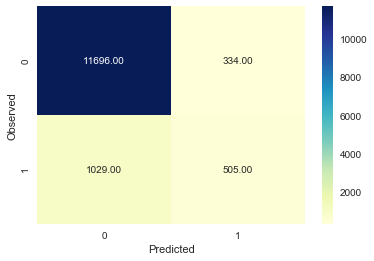

None

Recall: 0.32920469361147325

Precision: 0.601907032181168

F1 Score: 0.42562157606405393

Roc Auc Score: 0.6507203850434755


In [213]:
## function to get confusion matrix in a proper format
def draw_cm( actual, predicted ):
    cm = confusion_matrix( actual, predicted)
    sns.heatmap(cm, annot=True,  fmt='.2f', xticklabels = [0,1], cmap="YlGnBu" , yticklabels = [0,1] )
    plt.ylabel('Observed')
    plt.xlabel('Predicted')
    plt.show()

model = LogisticRegression(random_state=7, penalty='l1', solver='liblinear', C=0.75) 
model.fit(xtrain, ytrain)
y_predict = model.predict(xtest)

print("Trainig accuracy",model.score(xtrain,ytrain))  
print()
print("Testing accuracy",model.score(xtest, ytest))
print()
print('Confusion Matrix')
print(draw_cm(ytest,y_predict))
print()
print("Recall:",recall_score(ytest,y_predict))
print()
print("Precision:",precision_score(ytest,y_predict))
print()
print("F1 Score:",f1_score(ytest,y_predict))
print()
print("Roc Auc Score:",roc_auc_score(ytest,y_predict))

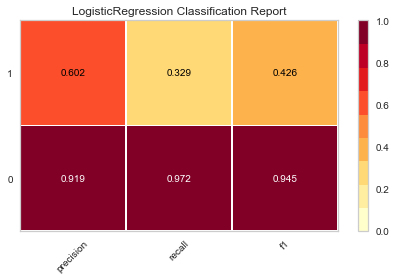

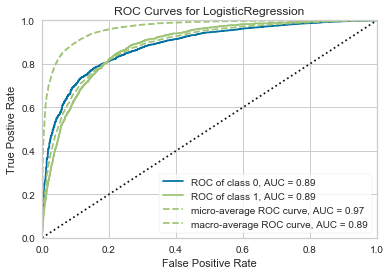

In [214]:
# Visualize model performance with yellowbrick library
viz = ClassificationReport(model)
viz.fit(xtrain, ytrain)
viz.score(xtest, ytest)
viz.show()

roc = ROCAUC(model)
roc.fit(xtrain, ytrain)
roc.score(xtest, ytest)
roc.show()
plt.show()

**Confusion matrix means**

*True Positive (observed=1,predicted=1):*

Prediction about the potential customers who may take the term deopsit and the customer took it.

*False Positive (observed=0,predicted=1):*

Predicted customers who will take the term deposit and the customer did not take it

*True Negative (observed=0,predicted=0):*

Predicted customers who will not be taking the term deposit and the customer did not take it

*False Negative (observed=1,predicted=0):*

Predicted customers who will not be taking the term deposit and the customer took it

Here more focus towards should be towards recall because our target variable is 'Term Deposit' , i.e whether the customer will subscribe for the term deposit or not. And the bank wants more people to subscribe the term deposit i.e. less number of False Negative. Hence the focus should be on increasing Recall.

After achieving the desired accuracy we can deploy the model for practical use, hte model can predict which customers will subscribe for hte term deposit and also for the upcoming customers.

In [215]:
#Store the accuracy results for each model in a dataframe for final comparison

resultsDf = pd.DataFrame({'Method':['Logistic Regression - liblinear - l1'], 'Accuracy': model.score(xtest, ytest), 'Recall': recall_score(ytest,y_predict), 'Precision': precision_score(ytest,y_predict),
                         'F1': f1_score(ytest,y_predict), 'ROC': roc_auc_score(ytest,y_predict)})
resultsDf = resultsDf[['Method', 'Accuracy',  'Recall', 'Precision', 'F1', 'ROC']]
resultsDf.round(4)

,Method,Accuracy,Recall,Precision,F1,ROC
0,Logistic Regression - liblinear - l1,0.8995,0.3292,0.6019,0.4256,0.6507


## Building Decision Tree

### Initial Models without any Tuning

In [216]:
solver = ['entropy', 'gini']

for i in solver:
    model = DecisionTreeClassifier(criterion = i, random_state = 7)
    display(model.fit(xtrain, ytrain))
    
    print('Solver:', i)
    print("Train: %.2f" % model.score(xtrain, ytrain))  # performance on train data
    print("Test: %.2f" % model.score(xtest, ytest))  # performance on test data
    treeObj = model.tree_
    print ('Total Nodes:',treeObj.node_count)
    print('Depth:',model.get_depth())
    print('Total Leaves:',model.get_n_leaves())


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=7, splitter='best')

Solver: entropy
Train: 1.00
Test: 0.88
Total Nodes: 5249
Depth: 36
Total Leaves: 2625


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=7, splitter='best')

Solver: gini
Train: 1.00
Test: 0.87
Total Nodes: 5557
Depth: 31
Total Leaves: 2779


Sample image for developed DT

In [217]:
## Calculating feature importance

features = [col for col in d1.columns if col != 'Target']
feat_importance = clf_pruned.tree_.compute_feature_importances(normalize=False)


feat_imp_dict = dict(zip(features, model.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.rename(columns = {0:'FeatureImportance'}, inplace = True)
feat_imp.sort_values(by=['FeatureImportance'], ascending=False)

,FeatureImportance
duration,0.248066
balance,0.133511
age,0.112829
day,0.102154
poutcome_success,0.095667
month,0.085764
job,0.053319
campaign,0.036223
education,0.031757
housing,0.026152


#### From the feature importance dataframe we can infer that various attributes are having an impact on the output variable

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.260685 to fit



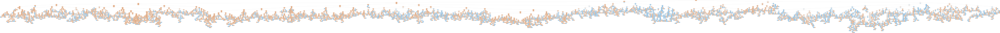

In [218]:
from sklearn.externals.six import StringIO 
import graphviz 
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(model, out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  

Image(graph.create_png())

#### Comparatively, using the Entropy criterion, the accuracy is observed higher for the test model. 

#### Without any pruning, there is a high degree of overfitting in the model

### Regularizing/pruning the DT by varying the max. depth and checking for different min. sample leaf

In [219]:
solver = ['gini', 'entropy']

for i in solver:
    
    train_score=[]                                 
    test_score=[]
    max_depths = np.linspace(1,36,8, endpoint = True)

    for max_depth in max_depths:
        clf_pruned = DecisionTreeClassifier(criterion = i, random_state = 7, max_depth = max_depth, min_samples_leaf = 3)
        clf_pruned.fit(xtrain, ytrain)
        train_score.append(round(clf_pruned.score(xtrain, ytrain),4))
        test_score.append(round(clf_pruned.score(xtest, ytest),4))
    
    print('The solver used:', i)
    print('Different depths:', max_depths)
    print()
    print('Train score:', train_score)
    print()
    print('Test score:', test_score)
    print('\n\n')

The solver used: gini
Different depths: [ 1.  6. 11. 16. 21. 26. 31. 36.]

Train score: [0.8813, 0.9032, 0.93, 0.9562, 0.9639, 0.9661, 0.9663, 0.9663]

Test score: [0.8869, 0.901, 0.8959, 0.8852, 0.8819, 0.8823, 0.8823, 0.8823]



The solver used: entropy
Different depths: [ 1.  6. 11. 16. 21. 26. 31. 36.]

Train score: [0.8813, 0.9021, 0.9229, 0.9525, 0.9673, 0.9705, 0.9704, 0.9704]

Test score: [0.8869, 0.9015, 0.8972, 0.8867, 0.8809, 0.8809, 0.8814, 0.8814]





In [220]:
solver = ['gini', 'entropy']

for i in solver:
    
    train_score=[]                                 
    test_score=[]

    max_depths = np.linspace(1,36,8, endpoint = True)

    for max_depth in max_depths:
        clf_pruned = DecisionTreeClassifier(criterion = i, random_state = 7, max_depth = max_depth, min_samples_leaf = 5)
        clf_pruned.fit(xtrain, ytrain)
        train_score.append(round(clf_pruned.score(xtrain, ytrain),4))
        test_score.append(round(clf_pruned.score(xtest, ytest),4))
    
    print('The solver used:', i)
    print('Different depths:', max_depths)
    print()
    print('Train score:', train_score)
    print()
    print('Test score:', test_score)
    print('\n\n')

The solver used: gini
Different depths: [ 1.  6. 11. 16. 21. 26. 31. 36.]

Train score: [0.8813, 0.9031, 0.9262, 0.9439, 0.947, 0.9478, 0.9478, 0.9478]

Test score: [0.8869, 0.9011, 0.8976, 0.8915, 0.8872, 0.8872, 0.887, 0.887]



The solver used: entropy
Different depths: [ 1.  6. 11. 16. 21. 26. 31. 36.]

Train score: [0.8813, 0.902, 0.9223, 0.9438, 0.9504, 0.9513, 0.9513, 0.9513]

Test score: [0.8869, 0.9017, 0.8969, 0.8937, 0.8889, 0.8897, 0.8897, 0.8897]





#### Observation

For the min. sample leaf of 5 at a max. depth of 6 the max. train & test accuracy is seen using the solver 'entropy'. 

The Accuracy is higher than the value observed without pruning

### Visualizing the above pruned DT

In [221]:
dot_data = StringIO()
export_graphviz(clf_pruned, out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  

Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.458094 to fit



In [222]:
#-----------------------------------Model validation Score--------------------------------------

clf_pruned = DecisionTreeClassifier(criterion = 'entropy', random_state = 7, max_depth = 6, min_samples_leaf = 5)
clf_pruned.fit(xtrain, ytrain)
train_score.append(round(clf_pruned.score(xtrain, ytrain),4))
test_score.append(round(clf_pruned.score(xtest, ytest),4))

print("Trainig accuracy",clf_pruned.score(xtrain, ytrain))  
print()

print("Testing accuracy",clf_pruned.score(xtest, ytest))
print()

print("----------------------Micro-----------------------------------------")
print("Recall:",recall_score(ytest,preds_test, average="micro"))
print()

print("Precision:",precision_score(ytest,preds_test, average="micro"))
print()

print("----------------------Macro-----------------------------------------")
print("Recall:",recall_score(ytest,preds_test, average="macro"))
print()

print("Precision:",precision_score(ytest,preds_test, average="macro"))
print()

Trainig accuracy 0.9019812304483837

Testing accuracy 0.9016514302565615

----------------------Micro-----------------------------------------
Recall: 0.9057800058979653

Precision: 0.9057800058979653

----------------------Macro-----------------------------------------
Recall: 0.6838289976926437

Precision: 0.7798275428016739



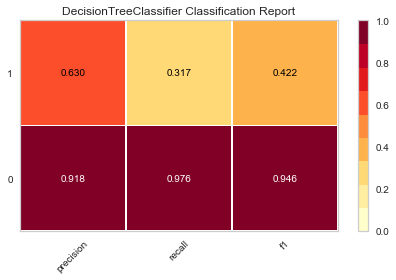

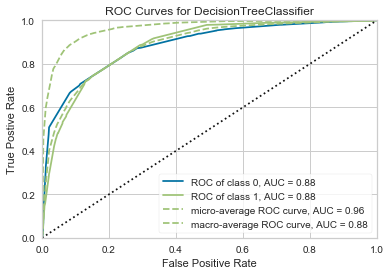

In [223]:
# Visualize model performance with yellowbrick library

viz = ClassificationReport(clf_pruned)
viz.fit(xtrain, ytrain)
viz.score(xtest, ytest)
viz.show()

roc = ROCAUC(clf_pruned)
roc.fit(xtrain, ytrain)
roc.score(xtest, ytest)
roc.show()

In [224]:
## Calculating feature importance

features = [col for col in d1.columns if col != 'Target']
feat_importance = clf_pruned.tree_.compute_feature_importances(normalize=False)


feat_imp_dict = dict(zip(features, clf_pruned.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.rename(columns = {0:'FeatureImportance'}, inplace = True)
feat_imp.sort_values(by=['FeatureImportance'], ascending=False)

,FeatureImportance
duration,0.495622
poutcome_success,0.245516
contact,0.095073
month,0.085326
housing,0.055711
day,0.011114
age,0.003365
balance,0.003310
marital,0.002062
job,0.001274


#### From the feature importance dataframe we can infer that the duration of call and outcome of previous marketing campaign are the attributes having highest impact.

In [225]:
pred_train = clf_pruned.predict(xtrain)
preds_test = clf_pruned.predict(xtest)

acc_DT = accuracy_score(ytest, preds_test)
rec_DT = recall_score(ytest, preds_test)
prec_DT = precision_score(ytest, preds_test)
f1_DT = f1_score(ytest, preds_test)
roc_DT = roc.score(xtest, ytest)

In [226]:
#Store the accuracy results for each model in a dataframe for final comparison

tempResultsDf = pd.DataFrame({'Method':['DT - Entropy - Pruned'], 'Accuracy': acc_DT, 'Recall': rec_DT, 'Precision': prec_DT, 'F1': f1_DT, 'ROC': roc_DT})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'Accuracy',  'Recall', 'Precision', 'F1', 'ROC']]

resultsDf.round(4)

,Method,Accuracy,Recall,Precision,F1,ROC
0,Logistic Regression - liblinear - l1,0.8995,0.3292,0.6019,0.4256,0.6507
0,DT - Entropy - Pruned,0.9017,0.3168,0.6295,0.4215,0.8849


## Random Forest Model

In [227]:
from sklearn.ensemble import RandomForestClassifier

rfcl = RandomForestClassifier(random_state=7)

rfcl = rfcl.fit(xtrain, ytrain)

rfcl

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=7, verbose=0,
                       warm_start=False)

In [228]:
pred_train = rfcl.predict(xtrain)
preds_test = rfcl.predict(xtest)

acc_RF = accuracy_score(ytest, preds_test)
rec_RF = recall_score(ytest, preds_test)
prec_RF = precision_score(ytest, preds_test)
f1_RF = f1_score(ytest, preds_test)
roc_RF = roc.score(xtest, ytest)

In [229]:
#Store the accuracy results for each model in a dataframe for final comparison

tempResultsDf = pd.DataFrame({'Method':['Random Forest'], 'Accuracy': acc_RF, 'Recall': rec_RF, 'Precision': prec_RF, 'F1': f1_RF, 'ROC': roc_RF})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'Accuracy',  'Recall', 'Precision', 'F1', 'ROC']]

resultsDf.round(4)

,Method,Accuracy,Recall,Precision,F1,ROC
0,Logistic Regression - liblinear - l1,0.8995,0.3292,0.6019,0.4256,0.6507
0,DT - Entropy - Pruned,0.9017,0.3168,0.6295,0.4215,0.8849
0,Random Forest,0.9021,0.3716,0.6103,0.4619,0.8849


In [230]:
## Calculating feature importance

features = [col for col in d1.columns if col != 'Target']
feat_importance = rfcl.feature_importances_


feat_imp_dict = dict(zip(features, rfcl.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.rename(columns = {0:'FeatureImportance'}, inplace = True)
feat_imp.sort_values(by=['FeatureImportance'], ascending=False)

,FeatureImportance
duration,0.258334
balance,0.116936
age,0.116432
day,0.106524
month,0.084675
poutcome_success,0.071838
job,0.057521
campaign,0.041138
education,0.030683
housing,0.024750


## Bagging

In [231]:
from sklearn.ensemble import BaggingClassifier

bgcl = BaggingClassifier(random_state=7)

bgcl = bgcl.fit(xtrain, ytrain)

bgcl

BaggingClassifier(base_estimator=None, bootstrap=True, bootstrap_features=False,
                  max_features=1.0, max_samples=1.0, n_estimators=10,
                  n_jobs=None, oob_score=False, random_state=7, verbose=0,
                  warm_start=False)

In [232]:
pred_train = bgcl.predict(xtrain)
preds_test = bgcl.predict(xtest)

acc_bg = accuracy_score(ytest, preds_test)
rec_bg = recall_score(ytest, preds_test)
prec_bg = precision_score(ytest, preds_test)
f1_bg = f1_score(ytest, preds_test)
roc_bg = roc.score(xtest, ytest)

In [233]:
#Store the accuracy results for each model in a dataframe for final comparison

tempResultsDf = pd.DataFrame({'Method':['Bagging'], 'Accuracy': acc_bg, 'Recall': rec_bg, 'Precision': prec_bg, 'F1': f1_bg, 'ROC': roc_bg})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'Accuracy',  'Recall', 'Precision', 'F1', 'ROC']]

resultsDf.round(4)

,Method,Accuracy,Recall,Precision,F1,ROC
0,Logistic Regression - liblinear - l1,0.8995,0.3292,0.6019,0.4256,0.6507
0,DT - Entropy - Pruned,0.9017,0.3168,0.6295,0.4215,0.8849
0,Random Forest,0.9021,0.3716,0.6103,0.4619,0.8849
0,Bagging,0.8968,0.3924,0.5626,0.4624,0.8849


## AdaBoosting

In [234]:
from sklearn.ensemble import AdaBoostClassifier

abcl = AdaBoostClassifier(random_state=7)

abcl = abcl.fit(xtrain, ytrain)

abcl

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=7)

In [235]:
pred_train = abcl.predict(xtrain)
preds_test = abcl.predict(xtest)

acc_ab = accuracy_score(ytest, preds_test)
rec_ab = recall_score(ytest, preds_test)
prec_ab = precision_score(ytest, preds_test)
f1_ab = f1_score(ytest, preds_test)
roc_ab = roc.score(xtest, ytest)

In [236]:
#Store the accuracy results for each model in a dataframe for final comparison

tempResultsDf = pd.DataFrame({'Method':['Ada Boosting'], 'Accuracy': acc_ab, 'Recall': rec_ab, 'Precision': prec_ab, 'F1': f1_ab, 'ROC': roc_ab})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'Accuracy',  'Recall', 'Precision', 'F1', 'ROC']]

resultsDf.round(4)

,Method,Accuracy,Recall,Precision,F1,ROC
0,Logistic Regression - liblinear - l1,0.8995,0.3292,0.6019,0.4256,0.6507
0,DT - Entropy - Pruned,0.9017,0.3168,0.6295,0.4215,0.8849
0,Random Forest,0.9021,0.3716,0.6103,0.4619,0.8849
0,Bagging,0.8968,0.3924,0.5626,0.4624,0.8849
0,Ada Boosting,0.9000,0.3657,0.5937,0.4526,0.8849


## Gradient Boosting

In [237]:
from sklearn.ensemble import GradientBoostingClassifier

gbcl = GradientBoostingClassifier(random_state=7)

gbcl = gbcl.fit(xtrain, ytrain)

gbcl

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=7, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [238]:
pred_train = gbcl.predict(xtrain)
preds_test = gbcl.predict(xtest)

acc_gb = accuracy_score(ytest, preds_test)
rec_gb = recall_score(ytest, preds_test)
prec_gb = precision_score(ytest, preds_test)
f1_gb = f1_score(ytest, preds_test)
roc_gb = roc.score(xtest, ytest)

In [239]:
#Store the accuracy results for each model in a dataframe for final comparison

tempResultsDf = pd.DataFrame({'Method':['Gradient Boosting'], 'Accuracy': acc_gb, 'Recall': rec_gb, 'Precision': prec_gb, 'F1': f1_gb, 'ROC': roc_gb})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'Accuracy',  'Recall', 'Precision', 'F1', 'ROC']]

resultsDf.round(4)

,Method,Accuracy,Recall,Precision,F1,ROC
0,Logistic Regression - liblinear - l1,0.8995,0.3292,0.6019,0.4256,0.6507
0,DT - Entropy - Pruned,0.9017,0.3168,0.6295,0.4215,0.8849
0,Random Forest,0.9021,0.3716,0.6103,0.4619,0.8849
0,Bagging,0.8968,0.3924,0.5626,0.4624,0.8849
0,Ada Boosting,0.9000,0.3657,0.5937,0.4526,0.8849
0,Gradient Boosting,0.9058,0.3970,0.6331,0.4880,0.8849


## GridSearch CV

In [240]:
from sklearn.model_selection import GridSearchCV

params = {'criterion':['gini','entropy'],'max_samples':[0.7,0.75,0.6,0.8],'bootstrap':[True],'n_estimators':list(range(10,120,20))} 

grid_search_model = GridSearchCV(RandomForestClassifier(random_state=7), params, verbose=1, cv=3) 

grid_search_model.fit(xtrain, ytrain) 

Fitting 3 folds for each of 48 candidates, totalling 144 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 144 out of 144 | elapsed:  3.3min finished


GridSearchCV(cv=3, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False, random_state=7,
                                   

In [241]:
grid_search_model.best_estimator_

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=0.6,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=90,
                       n_jobs=None, oob_score=False, random_state=7, verbose=0,
                       warm_start=False)

In [242]:
grid_search_model.best_params_

{'bootstrap': True,
 'criterion': 'entropy',
 'max_samples': 0.6,
 'n_estimators': 90}

In [243]:
from sklearn.ensemble import RandomForestClassifier
rfcl = RandomForestClassifier(n_estimators = 90, random_state=7, criterion = 'entropy', max_samples=0.6)
rfcl = rfcl.fit(xtrain, ytrain)
display(rfcl)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=0.6,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=90,
                       n_jobs=None, oob_score=False, random_state=7, verbose=0,
                       warm_start=False)

In [244]:
pred_RF = rfcl.predict(xtest)
acc_RF = accuracy_score(ytest, pred_RF)

acc_RF = accuracy_score(ytest, pred_RF)
rec_RF = recall_score(ytest, pred_RF)
prec_RF = precision_score(ytest, pred_RF)
f1_RF = f1_score(ytest, pred_RF)
roc_RF = roc.score(xtest, ytest)

In [245]:
#Store the accuracy results for each model in a dataframe for final comparison

tempResultsDf = pd.DataFrame({'Method':['Random Forest - Grid Search'], 'Accuracy': acc_RF, 'Recall': rec_RF, 'Precision': prec_RF, 'F1': f1_RF, 'ROC': roc_RF})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'Accuracy',  'Recall', 'Precision', 'F1', 'ROC']]

resultsDf.round(4)

,Method,Accuracy,Recall,Precision,F1,ROC
0,Logistic Regression - liblinear - l1,0.8995,0.3292,0.6019,0.4256,0.6507
0,DT - Entropy - Pruned,0.9017,0.3168,0.6295,0.4215,0.8849
0,Random Forest,0.9021,0.3716,0.6103,0.4619,0.8849
0,Bagging,0.8968,0.3924,0.5626,0.4624,0.8849
0,Ada Boosting,0.9000,0.3657,0.5937,0.4526,0.8849
0,Gradient Boosting,0.9058,0.3970,0.6331,0.4880,0.8849
0,Random Forest - Grid Search,0.9018,0.3338,0.6229,0.4346,0.8849


### Observation

From the above table, the use of the Decision Tree using Gradient Boosting is recommeded as it has high accuracy of 90.58% along with hte highest recall of 39.70%